# Assignment 1
## ✅ Rename the filename with your roll number. E.g. if your roll number is `MT24003` then rename the file `MT24003_a1.ipynb` before submitting.
## ✅ Write code only in the sections marked with `# YOUR CODE HERE`. No, you can NOT write code anywhere else.
## ✅ Download and extract the `data.zip` folder next to this file. If you extract it correctly, you will have a `data` folder next to this file.
## ❌ Do not modify any other function or class definitions; doing so may lead to the autograder failing to judge your submission, resulting in a zero.
## ❌ Deleting or adding new cells may lead to the `autograder` failing to judge your submission, resulting in a zero. Even if a cell is empty, do NOT delete it.
## ❌ Do NOT install / import any other libraries. You should be able to solve all the questions using only the libraries imported below.


In [1]:
# allowed imports
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy
import librosa
import cv2
import random
import time

In [2]:
PATH_TO_DATA_DIR = "./data/emotion"
path_to_images_dir = f"{PATH_TO_DATA_DIR}/images"
path_to_audio_dir = f"{PATH_TO_DATA_DIR}/audio"
path_to_metadata = f"{PATH_TO_DATA_DIR}/dataset_metadata.csv"

# `q1`: `Emotion Recognition Dataset`, `Random Number Generator`, and `Normalization`
   
* `q1a`: Load the **Crema-D dataset** by writing functions to handle different data types (CSV metadata, images, and audio).  
  The following helper functions are provided:

  1. **`load_csv(path_to_csv)`**  
     - **Input:** A string representing the path to a `.csv` file containing metadata.  
     - **Process:** Reads the CSV file using `pandas.read_csv`.  
     - **Output:** A pandas DataFrame with metadata such as file names, speaker IDs, and emotion labels.  

  2. **`load_images(path_to_image_file)`**  
     - **Input:** A string representing the path to an image file.  
     - **Process:** Loads the image using OpenCV (`cv2.imread`).  
     - **Output:** A NumPy array representing the pixel values of the image.  

  3. **`load_audio(path_to_audio_file)`**  
     - **Input:** A string representing the path to an audio file.  
     - **Process:** Loads the audio using `librosa.load` with the original sampling rate preserved (`sr=None`).  
     - **Output:** A tuple `(sr, audio)` where:  
       - `sr` → the sampling rate of the audio file,  
       - `audio` → a NumPy array containing the audio waveform samples.  

  ---
  **Expected Output per Function Call:**  
  - `load_csv` → DataFrame with metadata.  
  - `load_images` → NumPy array of image pixels.  
  - `load_audio` → `(sampling_rate, audio_waveform)` tuple.  

* `q1b`: **Implement a random number generator from scratch** (do **not** use `random`, `numpy`, or any built-in RNG libraries).  
  Your generator should be capable of producing **pseudo-random numbers** given a seed. It should support:

  1. **Uniformly distributed floating-point numbers** between 0 and 1.

  **Input:**
  - `shape` (`int` or `tuple`): The shape of the output list or multi-dimensional array. For example, `5` produces a list of 5 numbers, `(2,3)` produces a 2×3 list of lists.

  **Output:**
  - A list of random numbers shaped according to `shape`.
    - If `shape` is an int, returns a list of length `shape`.
    - If `shape` is a tuple, returns nested lists with the same dimensions as `shape`.


* `q1c`: **Implement min max scaling normalization** that can take numerical data (e.g., tensors or arrays) and normalize it.  

  Your implementation should:

  1. Compute the **min** and **max** of the dataset.
  2. Apply normalization so that the resulting data is between **0 and 1**.
  3. Work for **1D data** (vectors) as well as **2D or 3D data** (e.g., images, spectrograms).

  **Input:**
  - `tensor` (array-like or tensor): Numerical data to normalize. Can be 1D, 2D, or 3D.
    - For 1D: a vector of numbers.
    - For 2D: e.g., `[rows, columns]` matrix.
    - For 3D: e.g., `[channels, height, width]` or similar multi-dimensional array.

  **Output:**
  - **Normalized data** with data between 0 and 1, and of the same shape as input.

---

`q1` Grading [Total: 1 point]:

1. `q1a`: **0.3 points** if the code runs without any errors on hidden test cases, otherwise 0 points. No partial points.  
2. `q1b`: **0.4 points** if the code runs without any errors on hidden test cases, otherwise 0 points. No partial points.  
3. `q1c`: **0.3 points** if the code runs without any errors on hidden test cases, otherwise 0 points. No partial points.

---

You are provided with the following template. **Populate only the sections marked as `# YOUR CODE HERE`. Do not modify other parts of the template.**


## `q1a`: Crema D Dataset

In [3]:
def load_csv(path_to_csv):
    """
    Load a CSV file into a structured table format.

    Args:
        path_to_csv (str): Path to the CSV file.

    Returns:
        table-like object: The contents of the CSV file as a table.
    """
    # YOUR CODE HERE
    df = pd.read_csv(path_to_csv)
    return df

def load_image(path_to_image_file):
    """
    Load an image from a file.

    Args:
        path_to_image_file (str): Path to the image file.

    Returns:
        array: The image data as a multi-dimensional array. The image must have 3 channels in this order: RGB.
    """
    # YOUR CODE HERE
    image = cv2.imread(path_to_image_file, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return img



def load_audio(path_to_audio_file):
    """
    Load an audio file.

    Args:
        path_to_audio_file (str): Path to the audio file.

    Returns:
        tuple:
            int: Sampling rate of the audio.
            array: Audio waveform data as a 1D numeric array.
    """
    # YOUR CODE HERE
    audio, samplerate = librosa.load(path_to_audio_file, sr=None, mono=True)
    return samplerate, audio

## `q1b`: Random Number Generator

In [4]:
def generate_random_numbers(
    shape,
):
    """
    Generates random numbers shaped into a list or nested lists.

    Args:
        shape (int or tuple of ints): Shape of the output.
            - If an integer, returns a list of length `shape`.
            - If a tuple, returns nested lists matching the dimensions in `shape`.

    Returns:
        list: Random numbers shaped according to `shape`.
            - If `shape` is an int, returns a list of length `shape`.
            - If `shape` is a tuple, returns nested lists with the same dimensions as `shape`.
    """
    # YOUR CODE HERE
    if not hasattr(generate_random_numbers, "seed"):
        generate_random_numbers.seed = int(time.time() * 1000)

    def _lcg():
        """Generates one random float and updates the function's seed attribute."""
        a = 1664525
        c = 1013904223
        m = 2**32
        
        generate_random_numbers.seed = (a * generate_random_numbers.seed + c) % m
        
        return generate_random_numbers.seed / m

    def _generate_recursive(shape_tuple):
        """Recursively builds the nested list structure."""
        if not shape_tuple:
            return _lcg()
        return [_generate_recursive(shape_tuple[1:]) for _ in range(shape_tuple[0])]
    if isinstance(shape, int):
        # Handle the simple 1D case
        return [_lcg() for _ in range(shape)]
    elif isinstance(shape, tuple):
        # Handle multi-dimensional shapes with the recursive helper
        return _generate_recursive(shape)
    else:
        raise TypeError("Shape must be an int or a tuple.")


## `q1c`: Implement normalization

In [5]:
def normalize(tensor):
    """
    Normalize a numerical tensor or array to the range [0, 1].

    Args:
        tensor (array-like): Input data, can be 1D, 2D, or higher-dimensional.

    Returns:
        array-like: Normalized tensor of the same shape as the input,
                    where the minimum value becomes 0 and the maximum becomes 1.
    """
    # YOUR CODE HERE
    def flatten(lst):
        for x in lst:
            if isinstance(x, list):
                yield from flatten(x)
            else:
                yield x

    values = list(flatten(tensor))
    min_val, max_val = min(values), max(values)

    if min_val == max_val:
        return [[0 for _ in row] for row in tensor]

    def normalize(x):
        if isinstance(x, list):
            return [normalize(v) for v in x]
        return (x - min_val) / (max_val - min_val)

    return normalize(tensor)

Generated random numbers: [0.27915577846579254, 0.008218746166676283, 0.5445310596842319, 0.7981888689100742, 0.56309051415883, 0.4741481994278729, 0.7677206529770046, 0.4559645215049386, 0.5812259807717055, 0.41171199595555663]

Filtered dataframe shape: (10, 5)
First few rows of filtered data:
                                   filename  actor_id  \
2077  ab9b4862-2ccf-418c-b615-e838c31071f5      1026   
61    c4eb4692-948d-4914-9ad6-b2d0535fba95      1001   
4052  70c10bc2-aa07-41f1-a7ed-fa78f45a9f31      1050   
5940  fcacfe8a-2032-402d-a822-7c0487b0b7e1      1073   
4190  1d46dbb3-4fcb-46c2-a360-68509bf7bda7      1052   

                       sentence_text emotion_text emotion_level_text  
2077     I wonder what this is about        Anger        Unspecified  
61       The airplane is almost full    Happy/Joy        Unspecified  
4052  Maybe tomorrow it will be cold      Disgust        Unspecified  
5940  Maybe tomorrow it will be cold    Happy/Joy        Unspecified  
4190    I'

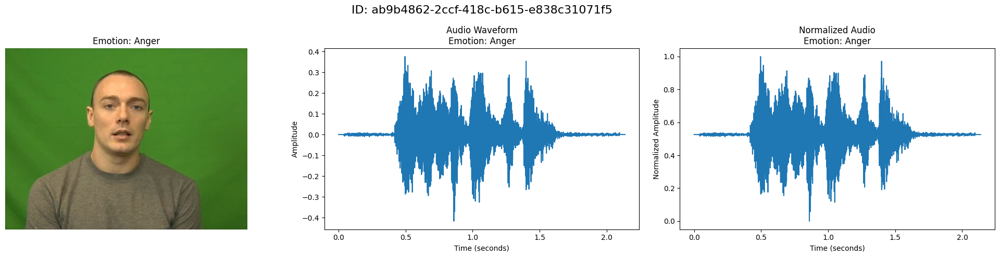

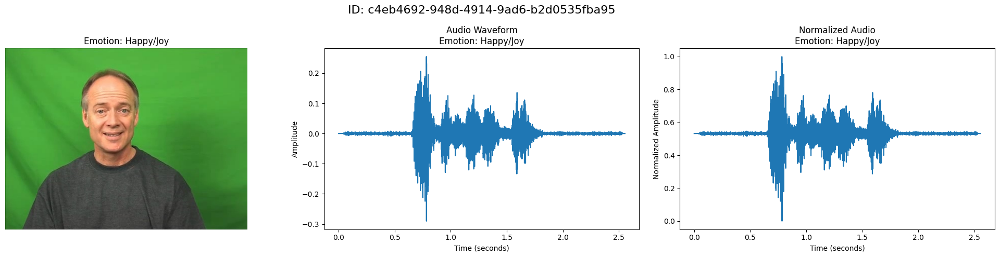

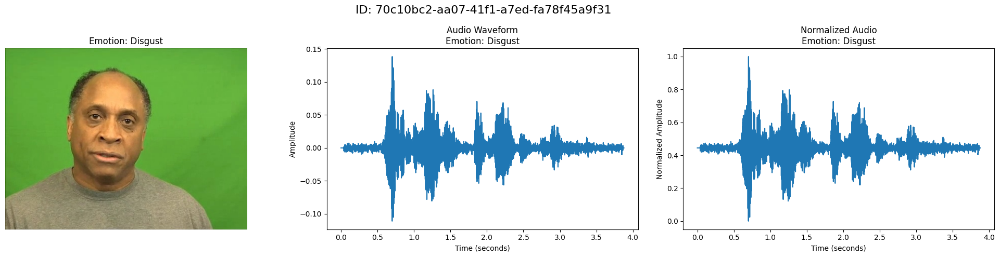

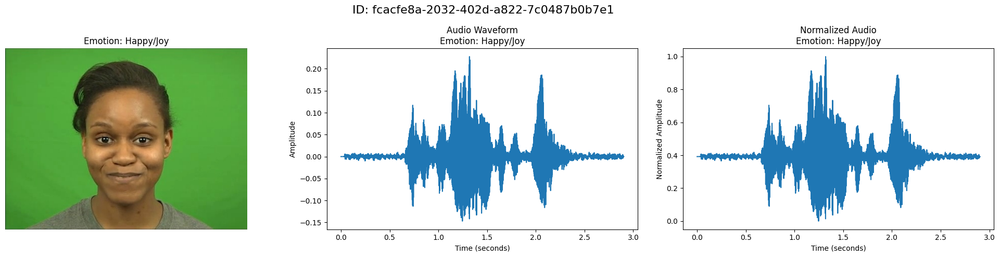

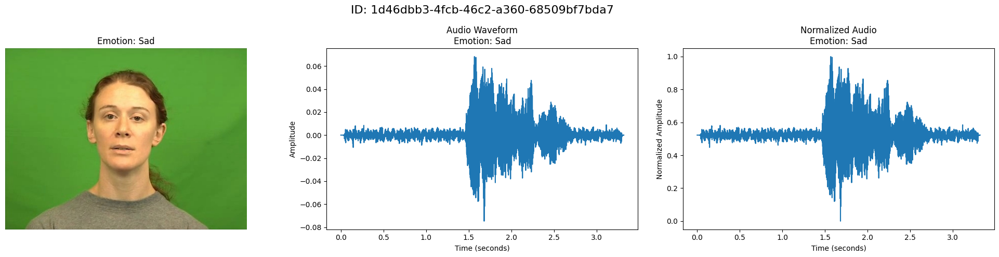

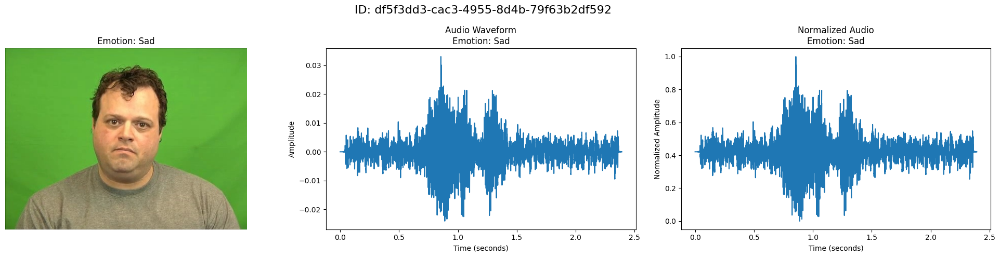

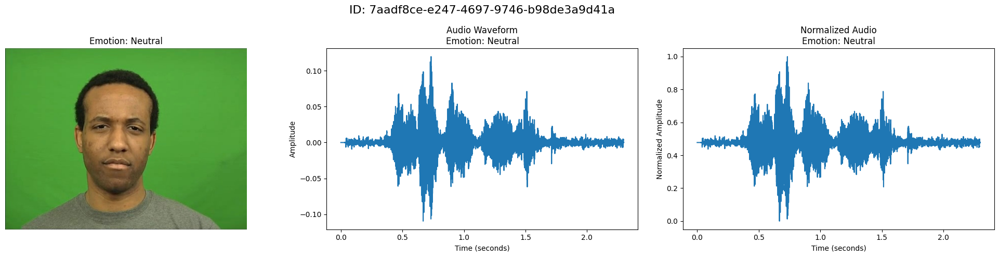

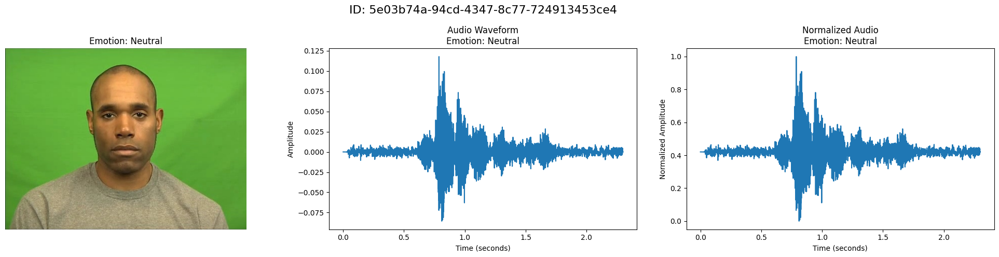

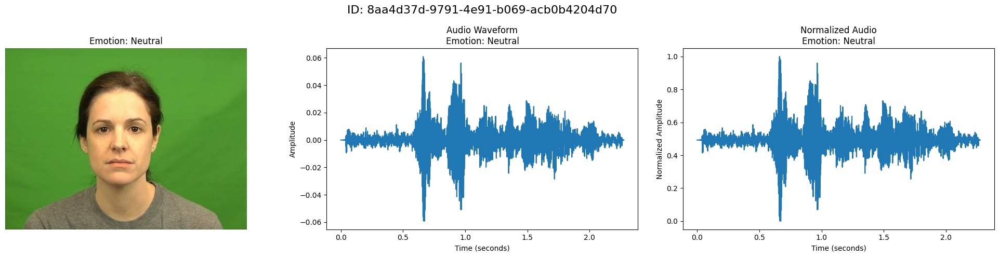

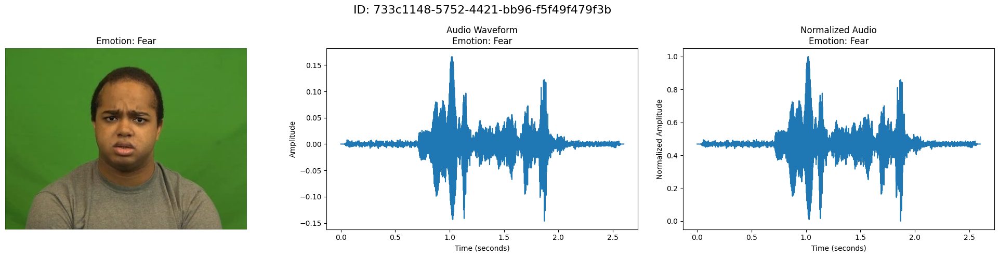

In [6]:
# You should NOT change this code cell.
metadata = load_csv(path_to_metadata)
random_numbers = generate_random_numbers(shape=10)
print("Generated random numbers:", random_numbers)

random_indexes = [int(len(metadata) * x) for x in random_numbers]
filtered_df = metadata.loc[random_indexes]
print("\nFiltered dataframe shape:", filtered_df.shape)
print("First few rows of filtered data:\n", filtered_df.head())

for idx, row in filtered_df.iterrows():
    filename = row["filename"]
    image_path = os.path.join(path_to_images_dir, filename + ".jpeg")
    audio_path = os.path.join(path_to_audio_dir, filename + ".wav")

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 5))
    fig.suptitle(f"ID: {filename}", fontsize=16)

    image = load_image(image_path)
    if image is not None:
        ax1.imshow(image)
        ax1.set_title(f"Emotion: {row['emotion_text']}")
        ax1.axis("off")
    else:
        ax1.text(0.5, 0.5, "Image not found", ha="center", va="center")
        ax1.axis("off")

    sr, audio = load_audio(audio_path)
    if audio is not None:
        time_axis = np.linspace(0, len(audio) / sr, num=len(audio))
        ax2.plot(time_axis, audio)
        ax2.set_title(f"Audio Waveform\nEmotion: {row['emotion_text']}")
        ax2.set_xlabel("Time (seconds)")
        ax2.set_ylabel("Amplitude")

        # Add normalized audio plot
        normalized_audio = normalize(audio)
        ax3.plot(time_axis, normalized_audio)
        ax3.set_title(f"Normalized Audio\nEmotion: {row['emotion_text']}")
        ax3.set_xlabel("Time (seconds)")
        ax3.set_ylabel("Normalized Amplitude")
    else:
        ax2.text(0.5, 0.5, "Audio not found", ha="center", va="center")
        ax2.axis("off")
        ax3.text(0.5, 0.5, "Audio not found", ha="center", va="center")
        ax3.axis("off")

    plt.tight_layout()
    plt.show()

# `q2`: Image Processing Tasks

* `q2a`: Resize images to `224x224`.  
  Your task is to implement a function that resizes input images to a fixed size of 224x224 pixels. The function should work for both color and grayscale images.

* `q2b`: Convert images to grayscale.  
  Your function should take a color image as input and return a single-channel grayscale image. Ensure that the output values are properly scaled (e.g., 0–255 or 0–1 depending on input).

* `q2c`: Split images into R, G, B channels.  
  Implement a function that takes a color image and returns three separate arrays corresponding to the red, green, and blue channels.

* `q2d`: Compute histogram from an image.  
  Your function should calculate the histogram of pixel values for a given grayscale image. The output should be a numeric array representing the frequency of each intensity value.

* `q2e`: Extract Local Binary Pattern (LBP) features.  
  Implement a function that computes LBP features from a grayscale image. The function should return a feature vector representing the LBP patterns.

* `q2f`: Extract Sobel features.  
  Your function should compute the Sobel gradients in the x and y directions and return either the magnitude, orientation, or both as features. The output should preserve the shape of the input image.

* `q2g`: Extract Histogram of Oriented Gradients (HOG) features.  
  Implement a function that computes HOG features from a grayscale or color image.  
  The function should return a tuple containing:  
    - the flattened HOG feature vector, and  
    - the resized grayscale image used for computation (to ensure consistent window size) and visualization.

**Grading [Total: 2 points]:**  
1. `q2a`–`q2d`: 0.2 points each if the code runs without errors on hidden test cases. Partial points are not awarded.  
2. `q2e`–`q2g`: 0.4 points each if the code runs without errors on hidden test cases. Partial points are not awarded.

---

You are provided with the following template. **Populate only the sections marked as `# YOUR CODE HERE`. Do not modify other parts of the template.**


## `q2a`: Image Resizing

In [7]:
def resize_image(image, size=(224, 224)):
    """
    Resize an input image to the specified dimensions.

    Args:
        image (array-like): Input image of shape (H, W) for grayscale or (H, W, C) for color images,
                            where H is height, W is width, and C is number of channels.
        size (tuple of int, optional): Desired output size as (width, height). Defaults to (224, 224).

    Returns:
        array-like: Resized image of shape (size[1], size[0]) for grayscale or
                    (size[1], size[0], C) for color images, preserving the number of channels.
    """
    # YOUR CODE HERE
    img = cv2.resize(image, size) 
    return img

## `q2b`: Convert Image to grascale

In [8]:
def convert_to_bw(image):
    """
    Convert a color image to a grayscale (black and white) image.

    Args:
        image (array-like): Input color image of shape (H, W, 3),
                            where H is height, W is width, and 3 represents RGB channels.

    Returns:
        array-like: Grayscale image of shape (H, W),
                    where each pixel represents intensity between 0 and 255.
    """
    # YOUR CODE HERE
    arr = np.array(image, dtype=float)

    if arr.ndim == 2:  
        gray = arr

    elif arr.ndim == 3 and arr.shape[2] == 3:
        r = arr[..., 0]
        g = arr[..., 1]
        b = arr[..., 2]

        gray = (0.3 * r) + (0.59 * g) + (0.11 * b)

    else:
        raise ValueError("Input must be a grayscale or RGB image.")
    
    return gray


## `q2c`: Image splitting into RGB channels

In [9]:
def split_rgb(image):
    """
    Split an RGB color image into its Red, Green, and Blue channels.

    Note:
        The input image must be in RGB format. The order of the returned channels
        is fixed as Red, Green, Blue and cannot be swapped.

    Args:
        image (array-like): Input RGB image of shape (H, W, 3),
                            where H is height, W is width, and 3 represents RGB channels.

    Returns:
        tuple of array-like: Three arrays corresponding to the Red, Green, and Blue channels,
                             each of shape (H, W).
    """
    # YOUR CODE HERE
    arr = np.array(image)

    if arr.ndim != 3 or arr.shape[2] != 3:
        raise ValueError("Input must be an RGB image of shape (H, W, 3).")

    red   = arr[..., 0]
    green = arr[..., 1]
    blue  = arr[..., 2]

    return red, green, blue

## `q2d`: Compute Histogram

In [10]:
def get_histogram(image_array):
    """
    Compute the pixel intensity histogram of a grayscale or single-channel image.

    Args:
        image_array (array-like): Input image of shape (H, W) for grayscale or single-channel images.
                                  Pixel values are expected in the range 0-255.

    Returns:
        array-like: 1D array of length 256, where each element represents the frequency
                    of the corresponding pixel intensity value from 0 to 255.
    """
    # YOUR CODE HERE
    arr = np.array(image_array, dtype=np.uint8)

    if arr.ndim != 2:
        raise ValueError("Input must be a grayscale image or single channel image.")

    hist = np.zeros(256, dtype=int)

    for value in arr.ravel():
        hist[value] += 1

    return hist

## `q2e`: Get LBP features

In [11]:
def get_image_lbp(img_array):
    """
    Compute the Local Binary Pattern (LBP) representation of a grayscale image.

    Args:
        img_array (array-like): Input grayscale image of shape (H, W) with pixel values in 0-255.

    Returns:
        tuple:
            - array-like: LBP image of shape (H, W) with unsigned 8-bit integers,
                          where each pixel encodes the local binary pattern.
            - array-like: Flattened 1D array of length H*W containing the LBP values
                          as unsigned 8-bit integers.
    """
    # YOUR CODE HERE
    H, W = img_array.shape

    padded_img = np.pad(img_array, pad_width=1, mode='constant', constant_values=0)

    lbp_img = np.zeros((H, W), dtype=np.uint8)

    neighbors = [
        (-1, -1), (-1, 0), (-1, 1),
        (0, 1), (1, 1), (1, 0),
        (1, -1), (0, -1)
    ]

    for i in range(H):
        for j in range(W):
            center = padded_img[i+1, j+1]
            lbp_value = 0
            for k, (dy, dx) in enumerate(neighbors):
                neighbor_val = padded_img[i+1+dy, j+1+dx]
                lbp_value |= (neighbor_val >= center) << k
            lbp_img[i, j] = lbp_value

    return lbp_img, lbp_img.flatten()
    

## `q2f`: Get Sobel features

In [12]:
def get_sobel_edges(img_array):
    """
    Compute the Sobel edge detection gradients and gradient magnitude of a grayscale image.

    Args:
        img_array (array-like): Input grayscale image of shape (H, W) with pixel values in 0-255.

    Returns:
        tuple:
            - array-like: Sobel gradient along the x-axis of shape (H, W), unsigned 8-bit integers.
            - array-like: Sobel gradient along the y-axis of shape (H, W), unsigned 8-bit integers.
            - array-like: Gradient magnitude image of shape (H, W), unsigned 8-bit integers.
    """
    # YOUR CODE HERE
    grad_x = cv2.Sobel(img_array, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(img_array, cv2.CV_64F, 0, 1, ksize=3)

    grad_x_abs = cv2.convertScaleAbs(grad_x)
    grad_y_abs = cv2.convertScaleAbs(grad_y)

    magn = np.sqrt(grad_x**2 + grad_y**2)

    magn_norm = magn / magn.max() * 255
    magn_uint8 = magn_norm.astype(np.uint8)

    return grad_x_abs, grad_y_abs, magn_uint8

## `q2g`: Get HOG features

In [13]:
def get_hog_features(
    img,
    win_size=(64, 128),
    block_size=(16, 16),
    block_stride=(8, 8),
    cell_size=(8, 8),
    nbins=9,
):
    """
    Extract HOG (Histogram of Oriented Gradients) features from an image.

    Args:
        img (numpy.ndarray): Input image (grayscale or BGR).
        win_size (tuple): Detection window size (resized to this).
        block_size (tuple): Size of a block in pixels.
        block_stride (tuple): Step size in pixels.
        cell_size (tuple): Size of a cell in pixels.
        nbins (int): Number of orientation bins.

    Returns:
        - numpy.ndarray: Flattened HOG feature vector.
        - numpy.ndarray: Resized grayscale image used for HOG computation.
    """
    # YOUR CODE HERE
    if len(img.shape) == 3:
        gray_img = convert_to_bw(img)
    else:
        gray_img = img

    resized_img = cv2.resize(gray_img, win_size)

    if resized_img.dtype != np.uint8:
            resized_img = np.uint8(resized_img)

    hog = cv2.HOGDescriptor(_winSize = win_size,
                            _blockSize = block_size,
                            _blockStride = block_stride,
                            _cellSize = cell_size,
                            _nbins = nbins)
    
    hog_features = hog.compute(resized_img)
    
    return hog_features.flatten(), resized_img

In [14]:
# You should NOT change this code cell.
def visualize_hog_features(
    img,
    hog_features,
    win_size=(64, 128),
    block_size=(16, 16),
    block_stride=(8, 8),
    cell_size=(8, 8),
    nbins=9,
    scale=10,
):
    """
    Visualize HOG features as an image.

    Args:
        img (numpy.ndarray): Grayscale image (resized to win_size).
        hog_features (numpy.ndarray): Flattened HOG feature vector.
        win_size, block_size, block_stride, cell_size, nbins: same as HOG descriptor.
        scale (float): Scale factor for gradient lines.

    Returns:
        numpy.ndarray: HOG visualization image.
    """
    img_vis = np.zeros(img.shape, dtype=np.float32)

    n_cells_x = win_size[0] // cell_size[0]
    n_cells_y = win_size[1] // cell_size[1]

    n_blocks_x = (win_size[0] - block_size[0]) // block_stride[0] + 1
    n_blocks_y = (win_size[1] - block_size[1]) // block_stride[1] + 1
    n_cells_per_block = (block_size[0] // cell_size[0]) * (
        block_size[1] // cell_size[1]
    )

    features_reshaped = hog_features.reshape(
        n_blocks_y, n_blocks_x, n_cells_per_block, nbins
    )

    for by in range(n_blocks_y):
        for bx in range(n_blocks_x):
            for cy in range(block_size[1] // cell_size[1]):
                for cx in range(block_size[0] // cell_size[0]):
                    cell_idx = cy * (block_size[0] // cell_size[0]) + cx
                    hist = features_reshaped[by, bx, cell_idx, :]
                    angle_step = np.pi / nbins
                    center_x = (
                        bx * block_stride[0] + cx * cell_size[0] + cell_size[0] // 2
                    )
                    center_y = (
                        by * block_stride[1] + cy * cell_size[1] + cell_size[1] // 2
                    )
                    for o, magnitude in enumerate(hist):
                        angle = o * angle_step
                        dx = int(magnitude * scale * np.cos(angle))
                        dy = int(magnitude * scale * np.sin(angle))
                        cv2.line(
                            img_vis,
                            (center_x - dx, center_y - dy),
                            (center_x + dx, center_y + dy),
                            color=255,
                            thickness=1,
                        )

    img_vis = (img_vis - img_vis.min()) / (img_vis.max() - img_vis.min()) * 255
    return img_vis.astype(np.uint8)

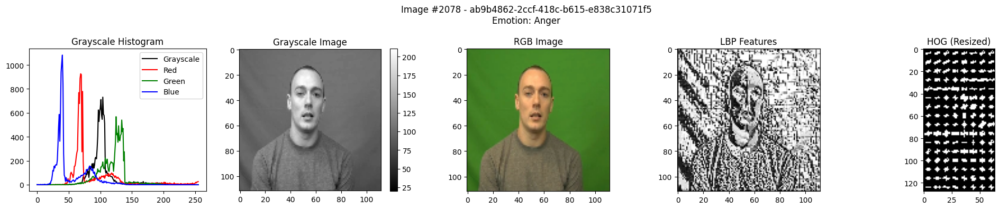

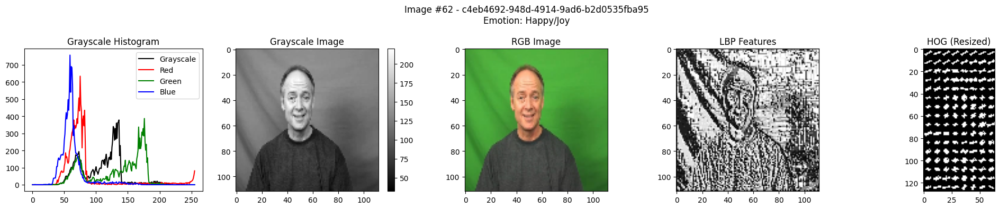

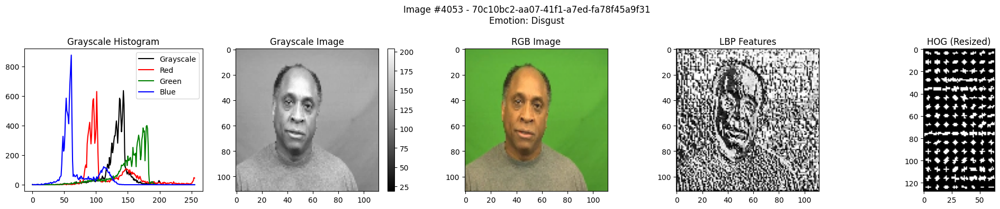

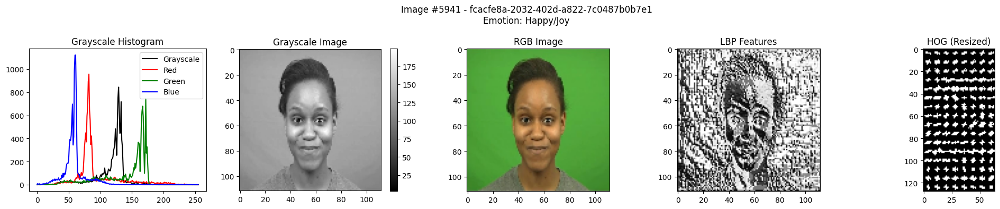

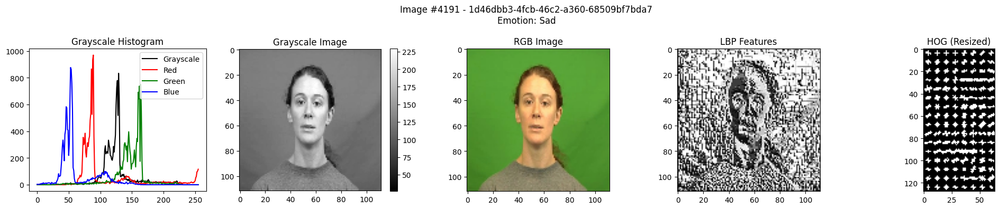

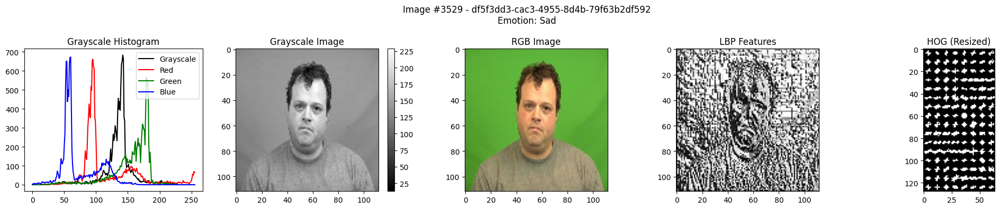

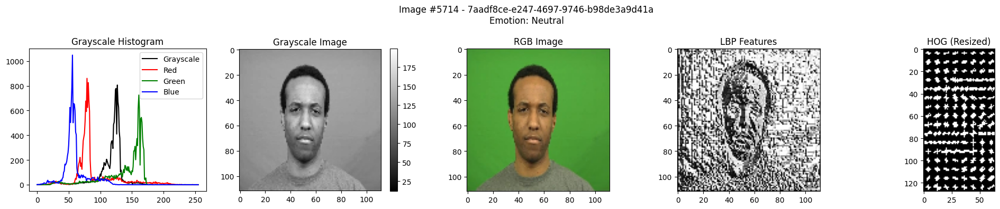

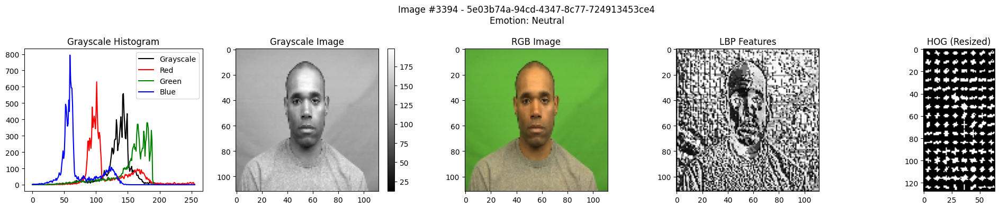

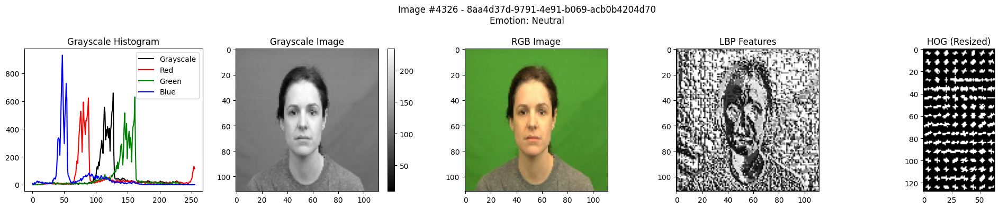

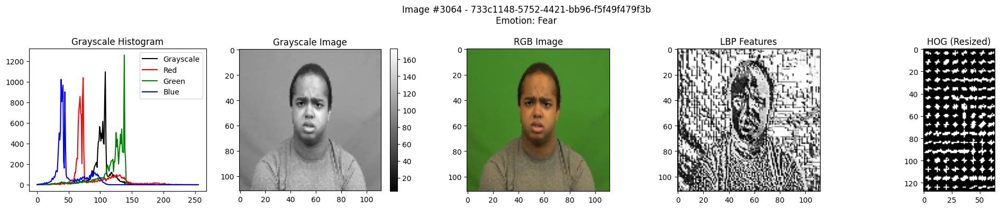

In [15]:
# You should NOT change this code cell.
for idx, row in filtered_df.iterrows():
    filename = row["filename"]
    image_path = os.path.join(path_to_images_dir, filename + ".jpeg")

    img_rgb = load_image(image_path)
    if img_rgb is None:
        continue

    img_resized = resize_image(img_rgb, size=(112, 112))
    img_bw_array = convert_to_bw(img_resized)
    lbp_vis, lbp_features = get_image_lbp(img_bw_array)
    hog_features, hog_image_array = get_hog_features(img_bw_array)
    hog_vis = visualize_hog_features(hog_image_array, hog_features)

    hist_bw = get_histogram(img_bw_array)
    r, g, b = split_rgb(img_resized)
    hist_r = get_histogram(r)
    hist_g = get_histogram(g)
    hist_b = get_histogram(b)

    fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(20, 4))
    fig.suptitle(f"Image #{idx+1} - {filename}\nEmotion: {row['emotion_text']}")

    ax1.plot(hist_bw, color="black", label="Grayscale")
    ax1.plot(hist_r, color="red", label="Red")
    ax1.plot(hist_g, color="green", label="Green")
    ax1.plot(hist_b, color="blue", label="Blue")
    ax1.legend()
    ax1.set_title("Grayscale Histogram")

    im2 = ax2.imshow(img_bw_array, cmap="gray")
    ax2.set_title("Grayscale Image")
    fig.colorbar(im2, ax=ax2)

    ax3.imshow(img_resized)
    ax3.set_title("RGB Image")

    ax4.imshow(lbp_vis, cmap="gray")
    ax4.set_title("LBP Features")

    ax5.imshow(hog_vis, cmap="gray")
    ax5.set_title("HOG (Resized)")

    plt.tight_layout()
    plt.show()

# `q3`: Audio Feature Extraction [Total: 2 points]


### Resampling Audio
* `q3a`: Resample Audio [0.2 points]
  * Implement a function `resample_audio(audio, orig_sr, target_sr)` that resamples an audio waveform from the original sampling rate (`orig_sr`) to the target sampling rate (`target_sr`).
  * Constraints:
    * You can use `librosa` or `scipy`
    * Input `audio` is a 1D NumPy array
    * Output must be a 1D NumPy array with resampled waveform


### Zero Crossing Rate  
* `q3b`: Compute Zero Crossing Rate (ZCR) [0.2 points]
  * Implement a function `get_signal_zcr(signal)` that computes the zero crossing rate of an audio signal.
  * Constraints:
    * Input `audio` is a 1D NumPy array
    * Output should be a single float value representing the ZCR


### Spectrogram
* `q3c`: Compute Spectrogram [0.3 points]
  * Implement a function `get_spec(audio)` that computes the linear-frequency spectrogram of the input audio in decibels (dB).
  * Constraints:
    * Output should be a 2D NumPy array `(freq_bins, time_frames)` in dB scale


### Mel Spectrogram
* `q3d`: Compute Mel Spectrogram [0.3 points]
  * Implement a function `get_melspec(audio, sr, n_fft=2048, hop_length=512, n_mels=128)` that computes the mel-scaled spectrogram.
  * Constraints:
    * Output should be a 2D NumPy array `(n_mels, time_frames)`


### Log-Mel Spectrogram
* `q3e`: Compute Log Mel Spectrogram [0.4 points]
  * Implement a function `get_log_melspec(melspec)` that computes the log-magnitude of the mel spectrogram.
  * Constraints:
    * Output should be a 2D NumPy array `(n_mels, time_frames)`


### Constant-Q Transform
* `q3f`: Compute Constant-Q Transform (CQT)(for additional information visit this [https://www.ee.columbia.edu/~dpwe/papers/Brown91-cqt.pdf]) [0.4 points]
  * Implement a function `get_cqt(audio, sr, hop_length, n_bins, bins_per_octave)` that computes the constant-Q transform of the audio signal.
  * Constraints:
    * Output should be a 2D NumPy array `(n_bins, time_frames)`


**Grading [Total: 2 points]:**
* `q3a`: 0.2 points - Resampling audio
* `q3b`: 0.2 points - Zero crossing rate
* `q3c`: 0.3 points - Spectrogram
* `q3d`: 0.3 points - Mel spectrogram  
* `q3e`: 0.4 points - Log-mel spectrogram
* `q3f`: 0.4 points - Constant-Q transform

No partial points will be awarded. Each function must run without errors on hidden test cases to receive points.

---

You are provided with the following template. **Populate only the sections marked as `# YOUR CODE HERE`. Do not modify other parts of the template.**


## `q3a`: Resampling audio

In [16]:
def resample_audio(audio, orig_sr, target_sr=16000):
    """
    Resample a 1D audio signal to a target sampling rate.

    Parameters:
        audio (numpy.ndarray): 1D array of the original audio waveform
                               with shape (n_samples,).
        orig_sr (int, optional): Original sampling rate in Hz.
        target_sr (int, optional): Target sampling rate in Hz. Default is 16000.

    Returns:
        numpy.ndarray: 1D array of the resampled audio waveform with
                       shape approximately (target_sr,) depending on duration.
    """
    # YOUR CODE HERE
    resampled = librosa.resample(y=audio, orig_sr=orig_sr, target_sr=target_sr)

    fixed_length = target_sr * 3

    if len(resampled) > fixed_length:
        resampled = resampled[:fixed_length]
    else:
        resampled = np.pad(resampled, (0, fixed_length - len(resampled)), mode='constant')
    
    return resampled

## `q3b`: Calculating ZCR

In [17]:
def get_signal_zcr(signal):
    """
    Compute the Zero Crossing Rate (ZCR) of a 1D audio signal.

    The Zero Crossing Rate measures how frequently the signal changes sign,
    which can be used as a feature for audio analysis.

    Parameters:
        signal (numpy.ndarray): 1D array of the audio waveform
                                with shape (n_samples,).

    Returns:
        float: Zero Crossing Rate (ZCR) of the input signal.
    """
    # YOUR CODE HERE
    zcr = librosa.feature.zero_crossing_rate(y=signal)
    return np.mean(zcr)

## `q3c`: Get Spectrogram

In [18]:
def get_spec(audio, n_fft=2048, hop_length=512):
    """
    Compute the spectrogram of an audio signal in decibels (dB).

    Parameters:
        audio (numpy.ndarray): 1D or 2D array representing the audio signal
                               (n_samples,)

    Returns:
        numpy.ndarray: Spectrogram of the input audio in dB scale,
                       with shape (n_freq_bins, n_frames).
    """
    # YOUR CODE HERE
    stft_result = librosa.stft(y=audio, n_fft=n_fft, hop_length=hop_length)
    
    spectrogram_db = librosa.amplitude_to_db(np.abs(stft_result), ref=np.max)
    
    return spectrogram_db

## `q3d`: Get Mel Spectrogram

In [19]:
def get_melspec(audio, sr, n_fft=2048, hop_length=512, n_mels=128):
    """
    Compute the Mel spectrogram of an audio signal.

    Parameters:
        audio (numpy.ndarray): 1D array representing the audio signal.
        sr (int): Sampling rate of the audio signal.
        n_fft (int, optional): Length of the FFT window. Default is 2048.
        hop_length (int, optional): Number of samples between successive frames. Default is 512.

    Returns:
        numpy.ndarray: Mel spectrogram with shape (n_mels, n_frames), where n_mels is
                       the number of Mel bands (default 128) and n_frames depends on the
                       length of the audio and hop_length.
    """
    # YOUR CODE HERE
    mel_spectrogram = librosa.feature.melspectrogram(
        y=audio,
        sr=sr,
        n_fft=n_fft,
        hop_length=hop_length,
        n_mels=n_mels
    )
    return mel_spectrogram

## `q3e`: Get Log Mel Spectrogram

In [20]:
def get_log_melspec(melspec):
    """
    Convert a Mel spectrogram to a logarithmic (dB) scale.

    Parameters:
        melspec (numpy.ndarray): Mel spectrogram, typically obtained from `get_melspec()`.
                                 Shape: (n_mels, n_frames)

    Returns:
        numpy.ndarray: Logarithmic Mel spectrogram (in decibels) with the same shape as input.
    """
    # YOUR CODE HERE
    log_mel_spectrogram = librosa.power_to_db(melspec, ref=np.max)
    return log_mel_spectrogram

## `q3f`: Get CQT

In [21]:
def get_cqt(audio, sr, hop_length=512, n_bins=84, bins_per_octave=12):
    """
    Compute the Constant-Q Transform (CQT) of an audio signal and return it in decibel scale.

    Parameters:
        audio (numpy.ndarray): The input audio signal (1D NumPy array).
        sr (int): Sampling rate of the audio signal.
        hop_length (int, optional): Number of samples between successive CQT frames.
                                  Default is 512.
        n_bins (int, optional): Total number of frequency bins to compute.
                               Default is 84.
        bins_per_octave (int, optional): Number of bins per octave (resolution of frequency axis).
                                        A value of 12 corresponds to semitone resolution.
                                        Default is 12.

    Returns:
        numpy.ndarray: Constant-Q transform of the audio signal in decibel (dB) scale.
                      Shape is (n_bins, t) where t is the number of time frames.
                      Rows correspond to frequency bins, columns correspond to time frames.
    """
    # YOUR CODE HERE
    cqt_complex = librosa.cqt(
        y=audio,
        sr=sr,
        hop_length=hop_length,
        n_bins=n_bins,
        bins_per_octave=bins_per_octave
    )
    
    cqt_db = librosa.amplitude_to_db(np.abs(cqt_complex), ref=np.max)
    
    return cqt_db

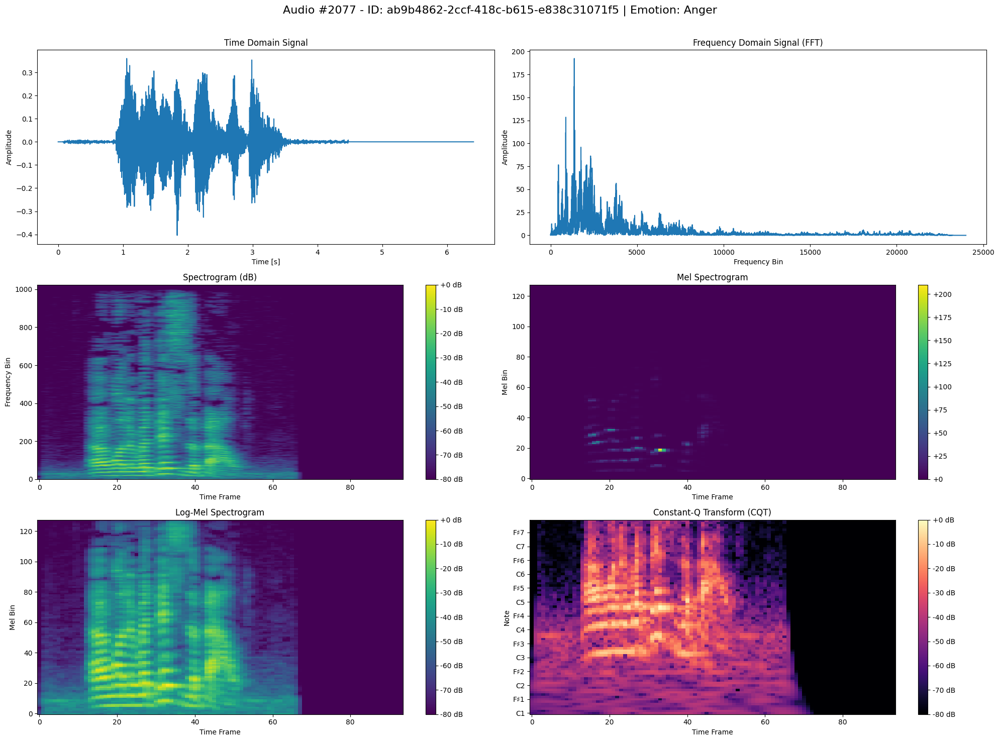

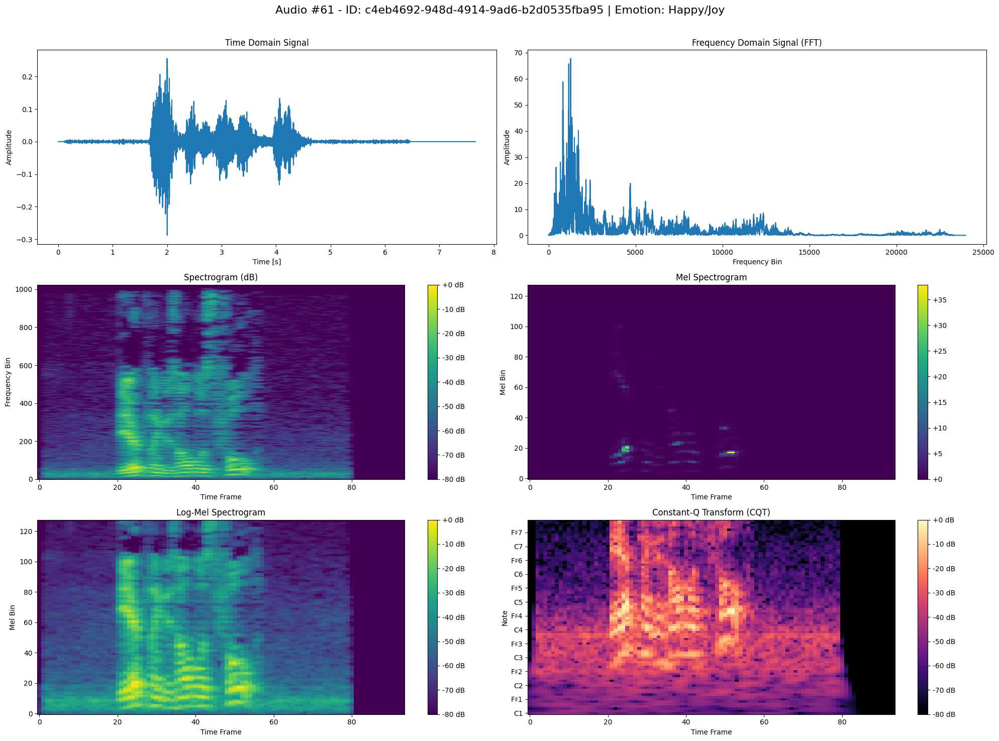

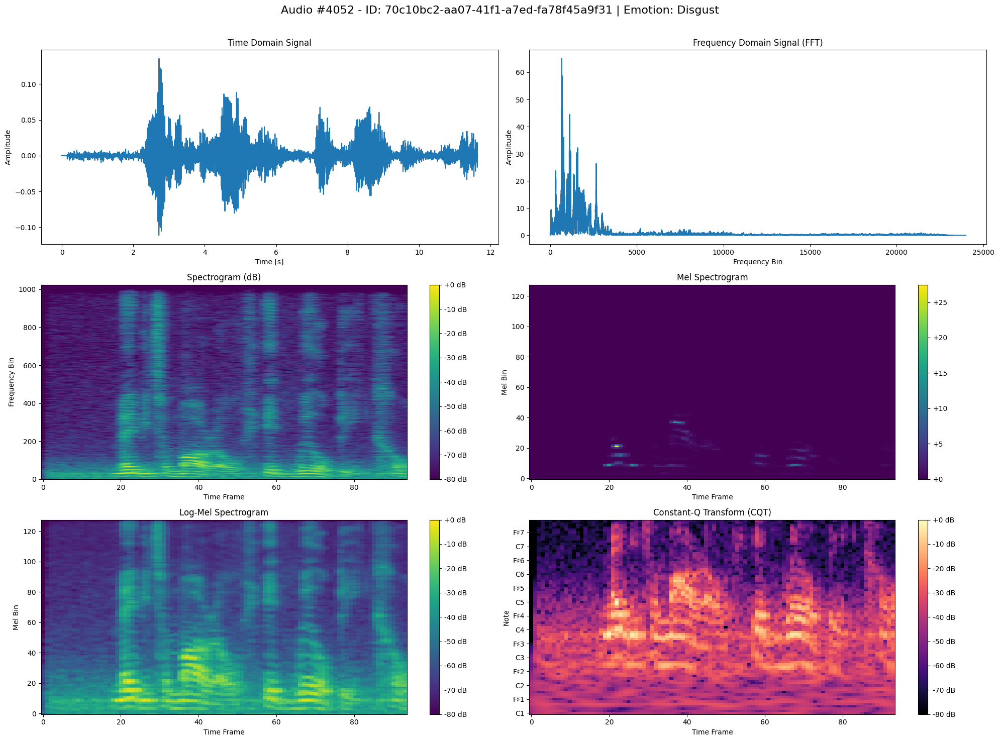

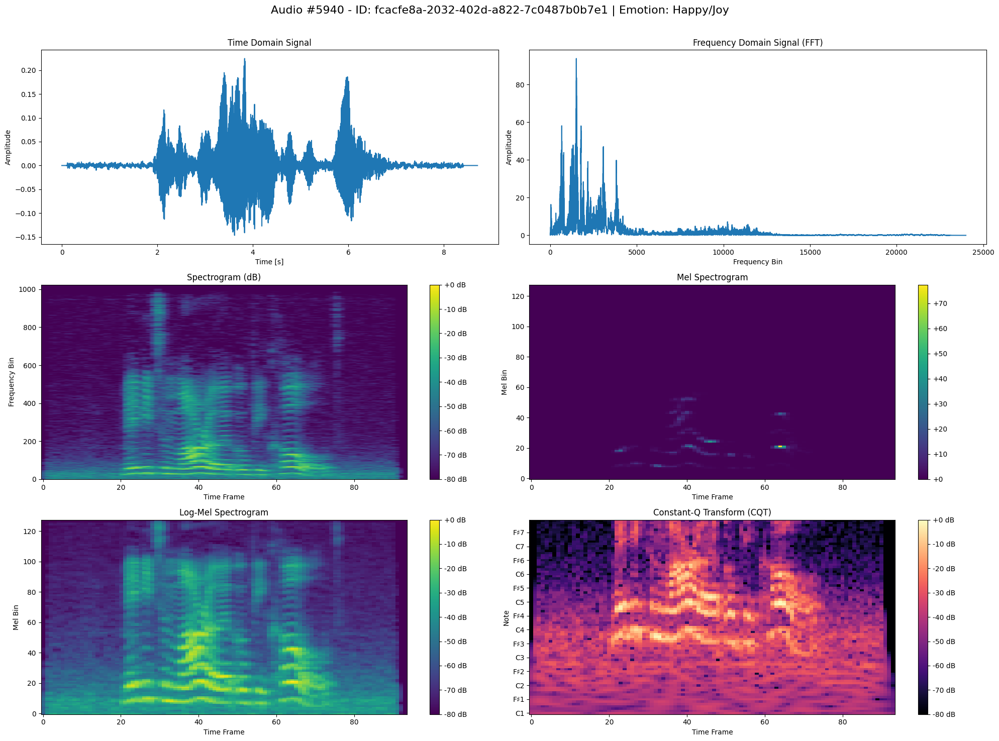

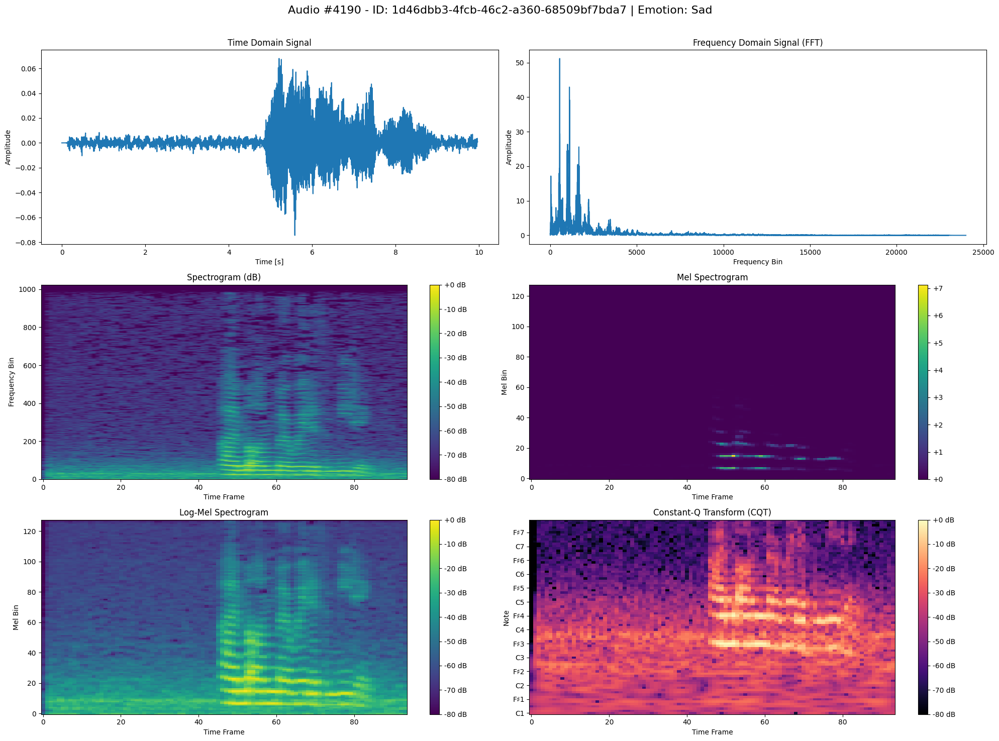

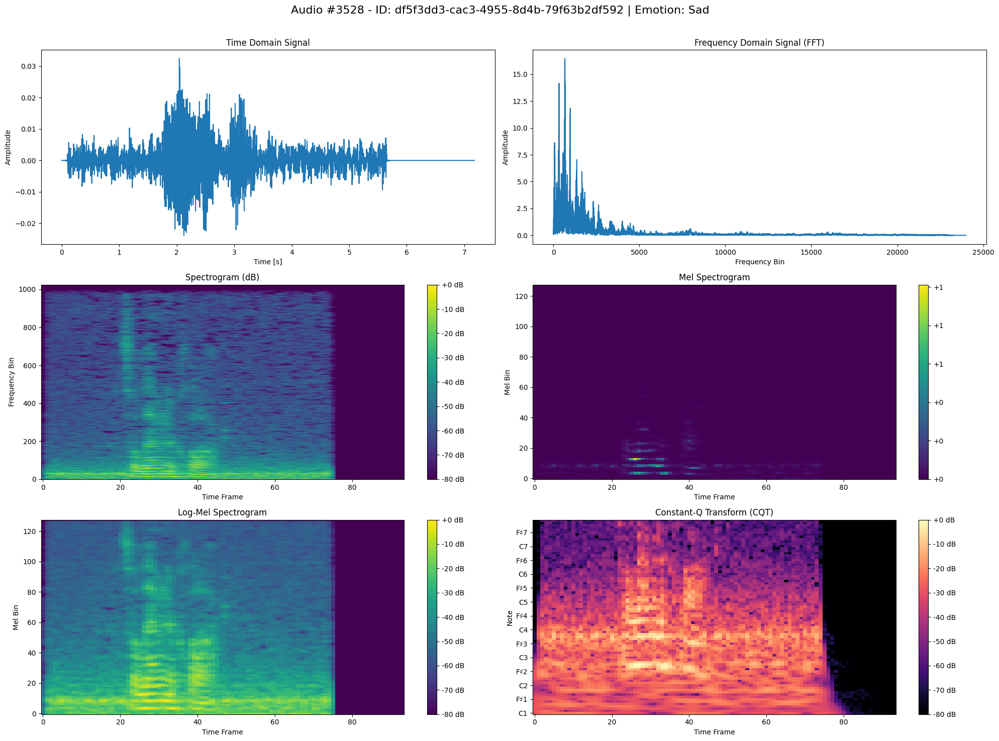

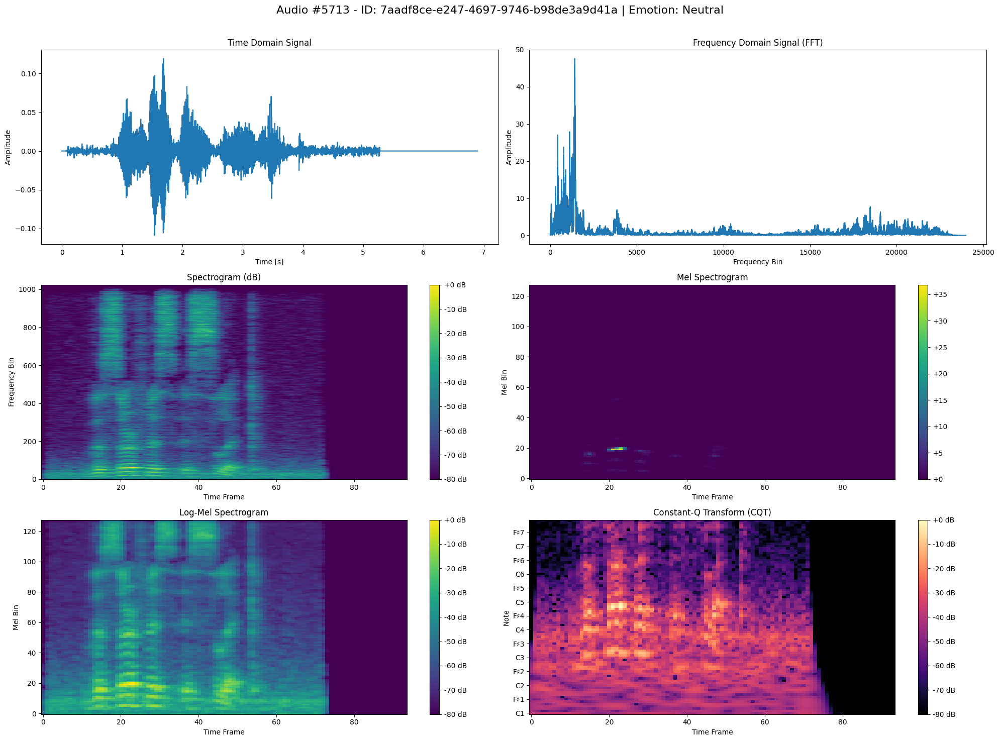

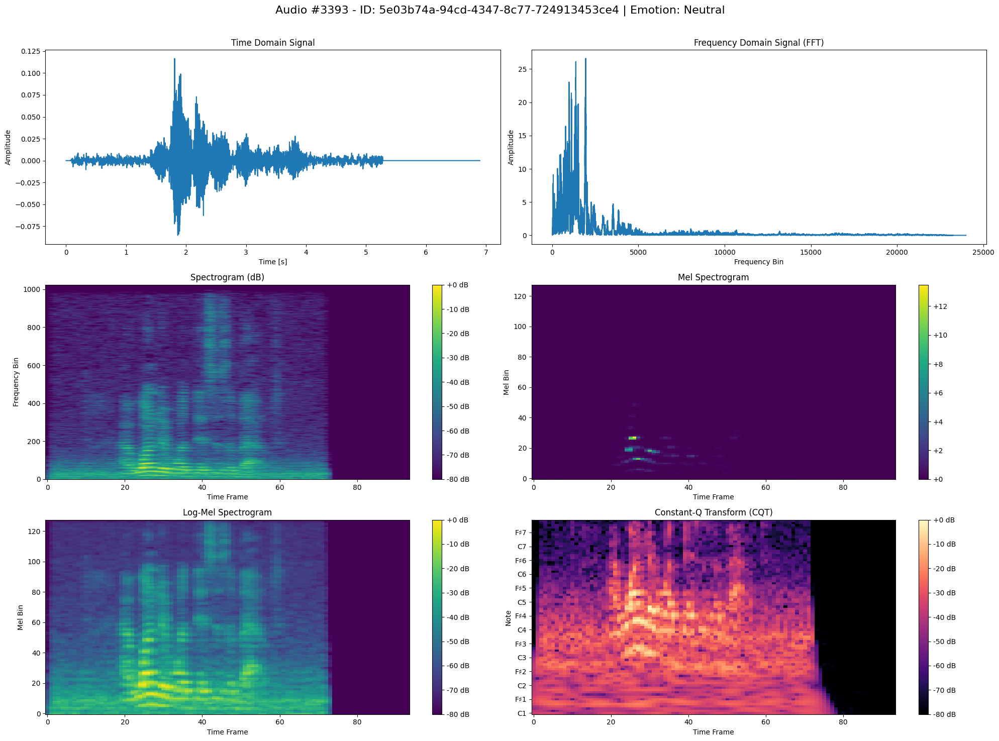

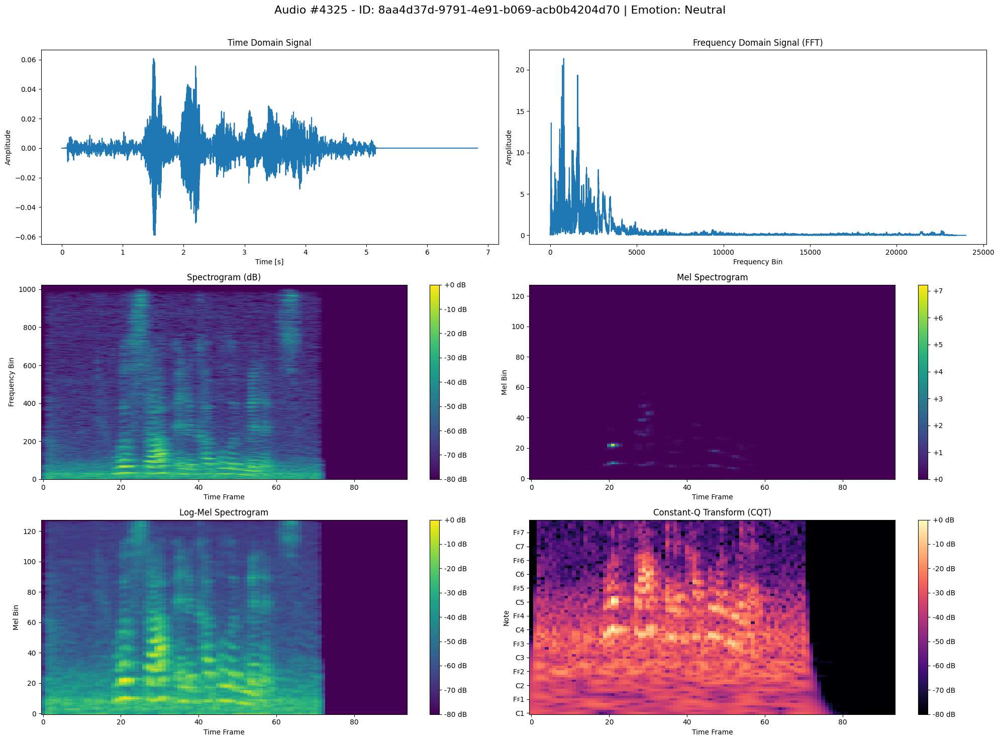

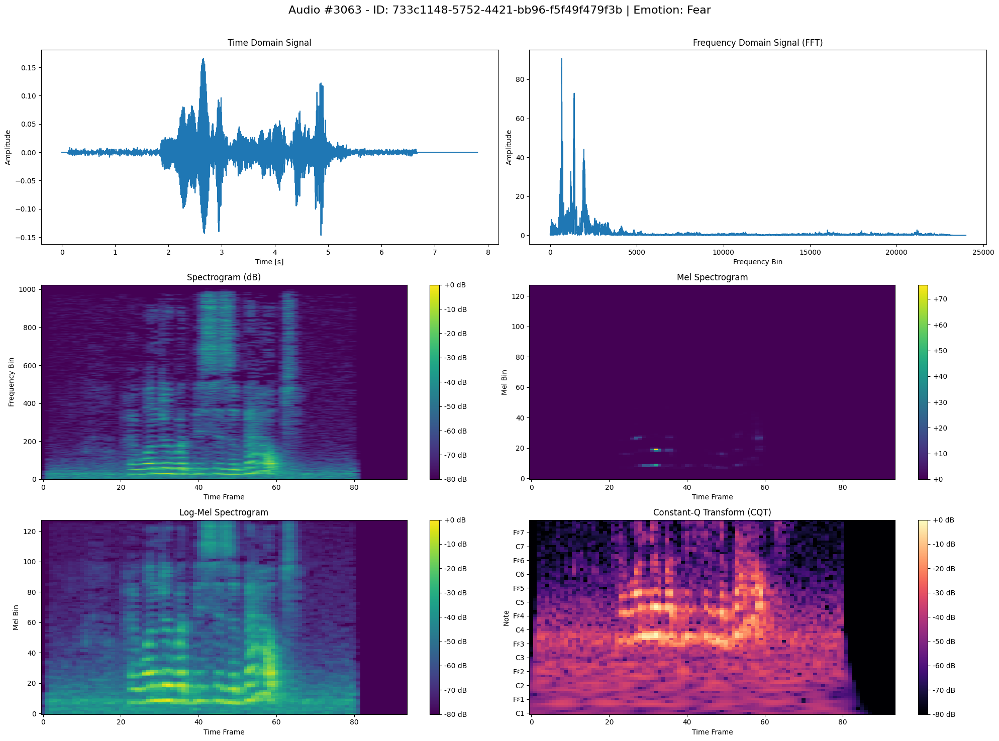

In [22]:
# You should NOT change this code cell.

plt.rcParams["figure.figsize"] = (20, 15)

for idx, row in filtered_df.iterrows():
    filename = row["filename"]
    audio_path = os.path.join(path_to_audio_dir, filename + ".wav")

    sr, audio = load_audio(audio_path)

    if audio is not None:
        audio_resampled = resample_audio(audio, sr, target_sr=16000)
        sr_resampled = 16000

        time_axis = np.arange(len(audio_resampled)) / sr_resampled
        duration = len(audio) / sr

        freq_domain_signal = np.abs(np.fft.fft(audio_resampled))[
            : len(audio_resampled) // 2
        ]

        spectrogram_db = get_spec(audio_resampled)
        mel_spec = get_melspec(audio_resampled, sr_resampled)
        log_mel_spec = get_log_melspec(mel_spec)
        cqt_db = get_cqt(audio_resampled, sr_resampled)

        frequencies = librosa.cqt_frequencies(
            n_bins=cqt_db.shape[0], fmin=librosa.note_to_hz("C1")
        )
        note_labels = librosa.hz_to_note(frequencies)

        fig, axs = plt.subplots(3, 2, figsize=(20, 15))
        fig.suptitle(
            f"Audio #{idx} - ID: {filename} | Emotion: {row['emotion_text']}",
            fontsize=16,
        )

        axs[0, 0].plot(time_axis * duration, audio_resampled)
        axs[0, 0].set_title("Time Domain Signal")
        axs[0, 0].set_xlabel("Time [s]")
        axs[0, 0].set_ylabel("Amplitude")

        axs[0, 1].plot(freq_domain_signal)
        axs[0, 1].set_title("Frequency Domain Signal (FFT)")
        axs[0, 1].set_xlabel("Frequency Bin")
        axs[0, 1].set_ylabel("Amplitude")

        img_spec = axs[1, 0].imshow(
            spectrogram_db, aspect="auto", origin="lower", cmap="viridis"
        )
        axs[1, 0].set_title("Spectrogram (dB)")
        axs[1, 0].set_xlabel("Time Frame")
        axs[1, 0].set_ylabel("Frequency Bin")
        fig.colorbar(img_spec, ax=axs[1, 0], format="%+2.0f dB")

        img_mel = axs[1, 1].imshow(
            mel_spec, aspect="auto", origin="lower", cmap="viridis"
        )
        axs[1, 1].set_title("Mel Spectrogram")
        axs[1, 1].set_xlabel("Time Frame")
        axs[1, 1].set_ylabel("Mel Bin")
        fig.colorbar(img_mel, ax=axs[1, 1], format="%+2.0f")

        img_logmel = axs[2, 0].imshow(
            log_mel_spec, aspect="auto", origin="lower", cmap="viridis"
        )
        axs[2, 0].set_title("Log-Mel Spectrogram")
        axs[2, 0].set_xlabel("Time Frame")
        axs[2, 0].set_ylabel("Mel Bin")
        fig.colorbar(img_logmel, ax=axs[2, 0], format="%+2.0f dB")

        img_cqt = axs[2, 1].imshow(cqt_db, aspect="auto", origin="lower", cmap="magma")
        axs[2, 1].set_title("Constant-Q Transform (CQT)")
        axs[2, 1].set_xlabel("Time Frame")
        axs[2, 1].set_ylabel("Note")
        step = 6
        axs[2, 1].set_yticks(np.arange(0, len(note_labels), step))
        axs[2, 1].set_yticklabels(note_labels[::step])
        fig.colorbar(img_cqt, ax=axs[2, 1], format="%+2.0f dB")

        plt.tight_layout(rect=[0, 0, 1, 0.97])
        plt.show()

# `q4`: Implement PCA from Scratch (4 Marks)

Your task is to implement **Principal Component Analysis (PCA)** from scratch in Python using NumPy. PCA is a widely used technique for **dimensionality reduction**, projecting high-dimensional data onto a lower-dimensional space defined by the top principal components.

The goal is to write a class `PCA` that can fit the data, compute the principal components, and transform the data to a lower-dimensional space.

## Marking Scheme

The question carries **4 marks** in total, distributed as follows:

| Task | Marks |
|------|-------|
| Implement `fit`, `transform`, and `fit_transform` methods correctly | 1 |
| Code runs correctly on sample dataset and outputs expected reduced data | 1 |
| Variance retention in reduced dimensions | 2 |

You PCA implementation will be tested on the mel-spectrogram of 1000 audio files. Following is the marking scheme for variance retention with 40 components:
- ≥90% variance retained: 2 marks
- ≥80% variance retained: 1.5 marks  
- ≥70% variance retained: 1 mark
- ≥60% variance retained: 0.5 marks
- <60% variance retained: 0 marks

## Requirements

1. Implement a `PCA` class with the following methods:
   - `fit(X)`: Fit the PCA model on dataset `X`
   - `transform(X=None)`: Project data onto principal components 
   - `fit_transform(X)`: Fit and transform data in one step

3. You may only use NumPy for implementation, no scikit-learn or other ML libraries.

4. The implementation should:
   - Standardize the input data
   - Compute covariance matrix
   - Find eigenvalues and eigenvectors
   - Sort and select top components
   - Project data onto reduced dimensions

---

You are provided with the following template. **Populate only the sections marked as `# YOUR CODE HERE`. Do not modify other parts of the template.**


In [23]:
class PCA:
    """
    Principal Component Analysis (PCA) for dimensionality reduction.

    This class performs PCA on a dataset, projecting it onto a lower-dimensional
    space defined by the top `n_components` principal components.

    Attributes
    ----------
    n_components : int
        Number of principal components to keep.
    eigenvalues : ndarray
        Eigenvalues corresponding to the selected principal components.
    eigenvectors : ndarray
        Eigenvectors (principal components) of shape (n_features, n_components).
    """

    def __init__(self, n_components):
        self.n_components = n_components
        # YOUR CODE HERE
        self.eigenvalues = None
        self.eigenvectors = None
        self.mean = None

    def fit(self, X):
        # YOUR CODE HERE
        self.mean = np.mean(X, axis=0)
        X_centered = X - self.mean
        cov_matrix = np.cov(X_centered, rowvar=False)

        eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)

        sorted_idx = np.argsort(eigenvalues)[::-1]
        eigenvalues = eigenvalues[sorted_idx]
        eigenvectors = eigenvectors[:, sorted_idx]

        self.eigenvalues = eigenvalues[: self.n_components]
        self.eigenvectors = eigenvectors[:, : self.n_components]


        return self

    def transform(self, X=None):
        # YOUR CODE HERE
        if self.mean is None or self.eigenvectors is None:
            raise ValueError("PCA has not been fitted yet.")


        X_centered = X - self.mean
        return np.dot(X_centered, self.eigenvectors)

    def fit_transform(self, X):
        # YOUR CODE HERE
        self.fit(X)
        return self.transform(X)

In [24]:
# You should NOT change this code cell.
metadata = load_csv(path_to_metadata)
random_numbers = generate_random_numbers(shape=1000)

random_indexes = [int(len(metadata) * x) for x in random_numbers]
filtered_df = metadata.loc[random_indexes]
audio_features = []

for idx, row in filtered_df.iterrows():
    filename = row["filename"]
    audio_path = os.path.join(path_to_audio_dir, filename + ".wav")

    sr, audio = load_audio(audio_path)

    target_sr = 16_000
    audio = resample_audio(audio, sr,target_sr=target_sr)
    mel_spec = get_melspec(audio, target_sr)
    audio_features.append(mel_spec.flatten()[:3000])

X = np.vstack(audio_features)

total_variance = np.sum(np.var(X, axis=0))

n_components = 40
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X)

transformed_variance = np.sum(np.var(X_pca, axis=0))
variance_percentage = (transformed_variance / total_variance) * 100

print(f"Percentage of variance retained: {variance_percentage:.2f}%")

Percentage of variance retained: 88.24%


# `q5`: Audio Data EDA for Multiple Files

Your task is to perform **Exploratory Data Analysis (EDA)** on all audio files in a given directory. The audio files may be in **MP3**, **WAV**, or **FLAC** formats. You will extract basic statistical properties from each audio file and organize the results in **separate NumPy arrays** for each format. This is a 2 marks question.

### Tasks

1. **Load all audio files** from the directory, handling MP3, WAV, and FLAC formats. You may use Python libraries such as `librosa` or `scipy.io.wavfile`.

2. For each audio file, compute the following:
   - **Sample rate**: Number of samples per second.
   - **Mean amplitude**: Average value of the audio signal.
   - **Standard deviation**: Standard deviation of the audio amplitudes.
   - **Variance**: Variance of the audio amplitudes.

3. **Organize the results in three separate NumPy arrays**:
   - `mp3_stats`: shape `(n_mp3_files, 4)` → statistics for all MP3 files.
   - `wav_stats`: shape `(n_wav_files, 4)` → statistics for all WAV files.
   - `flac_stats`: shape `(n_flac_files, 4)` → statistics for all FLAC files.  

   Columns in each array should be:  [sample_rate, mean_amplitude, std_dev, variance]


4. Ensure the code works for **any number of audio files** in the directory and each array contains only the corresponding format.

5. If plotting code or anything using this function is not able to run properly, you will get 0 marks, so please keep the formats mentioned. No partial marking

---

You are provided with the following template. **Populate only the sections marked as `# YOUR CODE HERE`. Do not modify other parts of the template.**


In [25]:
def audio_eda_stats(path_wav, path_mp3, path_flac, n_files=10):
    """
    Perform audio EDA on WAV, MP3, and FLAC files in given directories.

    Computes sample rate, mean amplitude, standard deviation, and variance
    for each audio file. Returns three NumPy arrays containing these statistics.

    Parameters:
        path_wav (str): Path to WAV files
        path_mp3 (str): Path to MP3 files
        path_flac (str): Path to FLAC files
        n_files (int): Number of files to randomly sample (default 10)

    Returns:
        mp3_stats (np.ndarray): Array of shape (num_mp3_files, 4),
                                each row = [sample_rate, mean, std_dev, variance]
        wav_stats (np.ndarray): Array of shape (num_wav_files, 4),
                                each row = [sample_rate, mean, std_dev, variance]
        flac_stats (np.ndarray): Array of shape (num_flac_files, 4),
                                 each row = [sample_rate, mean, std_dev, variance]
    """
    # YOUR CODE HERE
    def _process_directory(directory_path, extension, num_samples):
        """Helper function to process all audio files in a single directory."""
        stats_list = []
        try:
            all_files = [f for f in os.listdir(directory_path) if f.lower().endswith(extension)]
            
            num_to_sample = min(num_samples, len(all_files))
            if num_to_sample == 0:
                return np.empty((0, 4))
                
            sampled_files = random.sample(all_files, num_to_sample)

            for filename in sampled_files:
                filepath = os.path.join(directory_path, filename)
                try:
                    audio, sr = librosa.load(filepath, sr=None)
                   
                    mean_amp = np.mean(audio)
                    std_dev = np.std(audio)
                    variance = np.var(audio)
                   
                    stats_list.append([sr, mean_amp, std_dev, variance])
                except Exception as e:
                    print(f"Could not process file {filepath}: {e}")
                    continue
        except FileNotFoundError:
            print(f"Directory not found: {directory_path}")
        
        return np.array(stats_list)

    mp3_stats = _process_directory(path_mp3, '.mp3', n_files)
    wav_stats = _process_directory(path_wav, '.wav', n_files)
    flac_stats = _process_directory(path_flac, '.flac', n_files)
    
    return mp3_stats, wav_stats, flac_stats

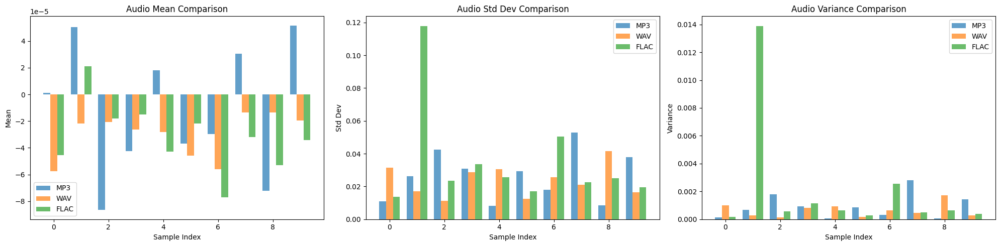

In [26]:
# You should NOT change this code cell.
mp3_stats, wav_stats, flac_stats = audio_eda_stats(
    path_wav="./data/audiocomp/audiowav",
    path_mp3="./data/audiocomp/audiomp3",
    path_flac="./data/audiocomp/audioflac",
    n_files=10,
)

fig, axes = plt.subplots(1, 3, figsize=(20, 5))
stats_labels = ["Mean", "Std Dev", "Variance"]

for i, (stat_name, ax) in enumerate(zip(stats_labels, axes)):
    mp3_vals = mp3_stats[:, i + 1]
    wav_vals = wav_stats[:, i + 1]
    flac_vals = flac_stats[:, i + 1]

    x = np.arange(len(mp3_vals))
    width = 0.25

    ax.bar(x - width, mp3_vals, width, label="MP3", alpha=0.7)
    ax.bar(x, wav_vals, width, label="WAV", alpha=0.7)
    ax.bar(x + width, flac_vals, width, label="FLAC", alpha=0.7)

    ax.set_title(f"Audio {stat_name} Comparison")
    ax.set_xlabel("Sample Index")
    ax.set_ylabel(stat_name)
    ax.legend()

plt.tight_layout()
plt.show()

# `q6`: Image Data EDA

**Task:** Perform exploratory data analysis (EDA) on images in three different formats: TIFF, PNG, and JPEG. This is **2 marks** question. No partial marking

### Instructions

1. **Input Directories**: You are given three folders containing images of the same dataset in different formats:
    - TIFF images
    - PNG images
    - JPEG images

2. **Random Sampling**: Randomly select 10 images (or all if fewer than 10) from the TIFF folder as the reference list.

3. **Compute Grayscale Statistics** for each selected image in **all three formats**:
    - Convert the image to grayscale.
    - Compute the following statistics:
        - `shape` → tuple (height, width)
        - `mean` → mean pixel intensity
        - `std_dev` → standard deviation of pixel intensities
        - `variance` → variance of pixel intensities
        - `histogram` → flattened array of length 256 representing the histogram of pixel intensities.

4. **Organize Results**:
    - Store results in a **nested dictionary**:
        - Outer key: base filename (without extension)
        - Inner keys: `"TIFF"`, `"PNG"`, `"JPEG"`
        - Each inner dictionary contains the computed statistics as described above.

### Output Format

The final output should be a Python dictionary of the form:

```python
results = {
    "image1": {
        "TIFF": {"shape": (H, W), "mean": float, "std_dev": float, "variance": float, "histogram": np.ndarray(256,)},
        "PNG":  {"shape": (H, W), "mean": float, "std_dev": float, "variance": float, "histogram": np.ndarray(256,)},
        "JPEG": {"shape": (H, W), "mean": float, "std_dev": float, "variance": float, "histogram": np.ndarray(256,)}
    },
    ...
}
```
Grading [Total: 2 points]
Compute all statistics correctly for TIFF, PNG, and JPEG images: 0.5 points each format
Organize the results in the required nested dictionary format: 0.5 points
Note: Partial points are not awarded; the code must run without errors on hidden test cases.

---

You are provided with the following template. **Populate only the sections marked as `# YOUR CODE HERE`. Do not modify other parts of the template.**


In [27]:
def compute_image_stats(tiff_dir, png_dir, jpeg_dir, n_samples=10):
    """
    Compute grayscale statistics for images in TIFF, PNG, and JPEG formats.

    Parameters:
        tiff_dir (str): Path to TIFF images.
        png_dir (str): Path to PNG images.
        jpeg_dir (str): Path to JPEG images.
        n_samples (int): Number of random images to process (default 10).

    Returns:
        dict: A dictionary where each key is the base filename, and each value is another
              dictionary with keys "TIFF", "PNG", "JPEG". Each inner dictionary contains:
                  - 'shape' (tuple): Grayscale image shape (height, width)
                  - 'mean' (float): Mean pixel intensity
                  - 'std_dev' (float): Standard deviation of pixel intensity
                  - 'variance' (float): Variance of pixel intensity
                  - 'histogram' (np.ndarray): Flattened histogram of pixel intensities (shape: (256,))
    """
    # YOUR CODE HERE
    results = {}
    try:
        tiff_files = [f for f in os.listdir(tiff_dir) if f.lower().endswith(('.tif', '.tiff'))]
        num_to_sample = min(n_samples, len(tiff_files))
        
        if num_to_sample == 0:
            return results
            
        sampled_basenames = [os.path.splitext(f)[0] for f in random.sample(tiff_files, num_to_sample)]

        for base_name in sampled_basenames:
            results[base_name] = {}

            tiff_path = os.path.join(tiff_dir, base_name + '.tif')
            if os.path.exists(tiff_path):
                image = cv2.imread(tiff_path)
                if image is not None:
                    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                    results[base_name]['TIFF'] = {
                        'shape': gray_image.shape,
                        'mean': np.mean(gray_image),
                        'std_dev': np.std(gray_image),
                        'variance': np.var(gray_image),
                        'histogram': cv2.calcHist([gray_image], [0], None, [256], [0, 256]).flatten()
                    }

            png_path = os.path.join(png_dir, base_name + '.png')
            if os.path.exists(png_path):
                image = cv2.imread(png_path)
                if image is not None:
                    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                    results[base_name]['PNG'] = {
                        'shape': gray_image.shape,
                        'mean': np.mean(gray_image),
                        'std_dev': np.std(gray_image),
                        'variance': np.var(gray_image),
                        'histogram': cv2.calcHist([gray_image], [0], None, [256], [0, 256]).flatten()
                    }

            jpeg_path = os.path.join(jpeg_dir, base_name + '.jpeg')
            if os.path.exists(jpeg_path):
                image = cv2.imread(jpeg_path)
                if image is not None:
                    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                    results[base_name]['JPEG'] = {
                        'shape': gray_image.shape,
                        'mean': np.mean(gray_image),
                        'std_dev': np.std(gray_image),
                        'variance': np.var(gray_image),
                        'histogram': cv2.calcHist([gray_image], [0], None, [256], [0, 256]).flatten()
                    }
    except FileNotFoundError as e:
        print(f"Error: Directory not found - {e}")

    return results



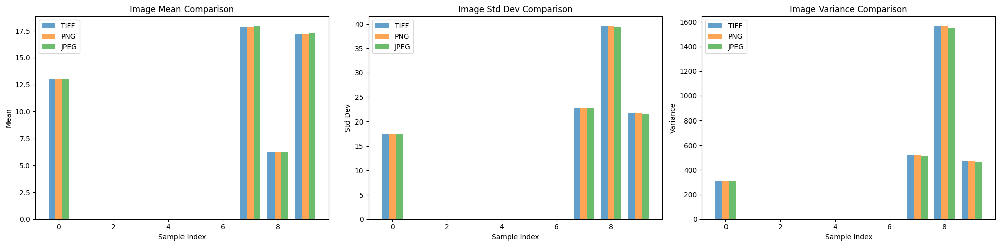

In [28]:
# You should NOT change this code cell.
path_tiff = "./data/imagecomp/TCGA_HT_A61B_19991127"
path_png = "./data/imagecomp/TCGA_HT_A61B_19991127png"
path_jpeg = "./data/imagecomp/TCGA_HT_A61B_19991127jpeg"
image_stats = compute_image_stats(path_tiff, path_png, path_jpeg, n_samples=10)

fig, axes = plt.subplots(1, 3, figsize=(20, 5))
stats_labels = ["Mean", "Std Dev", "Variance"]

# Get stats for each format
tiff_stats = []
png_stats = []
jpeg_stats = []

for base_name in image_stats:
    tiff_stats.append(
        [
            image_stats[base_name]["TIFF"]["mean"],
            image_stats[base_name]["TIFF"]["std_dev"],
            image_stats[base_name]["TIFF"]["variance"],
        ]
    )
    png_stats.append(
        [
            image_stats[base_name]["PNG"]["mean"],
            image_stats[base_name]["PNG"]["std_dev"],
            image_stats[base_name]["PNG"]["variance"],
        ]
    )
    jpeg_stats.append(
        [
            image_stats[base_name]["JPEG"]["mean"],
            image_stats[base_name]["JPEG"]["std_dev"],
            image_stats[base_name]["JPEG"]["variance"],
        ]
    )

tiff_stats = np.array(tiff_stats)
png_stats = np.array(png_stats)
jpeg_stats = np.array(jpeg_stats)

for i, (stat_name, ax) in enumerate(zip(stats_labels, axes)):
    x = np.arange(len(tiff_stats))
    width = 0.25

    ax.bar(x - width, tiff_stats[:, i], width, label="TIFF", alpha=0.7)
    ax.bar(x, png_stats[:, i], width, label="PNG", alpha=0.7)
    ax.bar(x + width, jpeg_stats[:, i], width, label="JPEG", alpha=0.7)

    ax.set_title(f"Image {stat_name} Comparison")
    ax.set_xlabel("Sample Index")
    ax.set_ylabel(stat_name)
    ax.legend()

plt.tight_layout()
plt.show()

# [BONUS]`q7`: Multimodal Feature-Based Emotion Classification using Linear Regression

**Task:** Combine image and audio features from an emotion dataset and perform classification using linear regression.

### Instructions

* `q7a`: Extract image features.  
  Implement a function to extract meaningful numerical features from each image (e.g., pixel values, histogram, or embeddings from a pre-trained model). Organize all image features into a matrix suitable for modeling.

* `q7b`: Extract audio features.  
  Implement a function to extract relevant features from each audio file (e.g., MFCCs, spectral features). Organize the features for each sample so they can be combined with the image features.

* `q7c`: Train and evaluate linear regression model.  
  You don't need to write any code for this question.

### Grading [Total: 2 marks]
The model accuracy on the test set is used to determine the marks.

- \>= 90% → 2
- 70-89% → 1
- 60-69% → 0.5
- < 50% → 0

---

You are provided with the following template. **Populate only the sections marked as `# YOUR CODE HERE`. Do not modify other parts of the template.**


## `q7a`: Get Image features

In [29]:
def get_image_features(id_):
    """
    Extracts image features for a given image file.

    Use the functions defined in the previous cells to extract the features.

    Return:
        np.ndarray: 1D array of shape (M,) containing extracted image features (float32).
    """
    image_feature = None
    # YOUR CODE HERE
    return image_feature

## `q7b`: Get Audio features

In [30]:
def get_audio_features(id_):
    """
    Extracts audio features for a given audio file.

    Return:
        np.ndarray: 1D array of shape (M,) containing extracted audio features (float32).
    """
    audio_feature = None
    # YOUR CODE HERE
    return audio_feature

In [31]:
# You should NOT change this code cell.
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

combined_features = []
labels = []
metadata = load_csv(path_to_metadata)
for _, row in metadata.iterrows():
    sample_id = row[0]

    audio_psd = get_audio_features(sample_id)

    img_features = get_image_features(sample_id)

    features = np.concatenate(
        [
            np.asarray(audio_psd, dtype=np.float32),
            np.asarray(img_features, dtype=np.float32),
        ]
    )

    combined_features.append(features)
    labels.append(row[3])


encoder = OneHotEncoder(sparse_output=False)
y_encoded = encoder.fit_transform(np.array(labels).reshape(-1, 1))

X_train, X_test, y_train_enc, y_test_enc, y_train_labels, y_test_labels = (
    train_test_split(
        combined_features,
        y_encoded,
        labels,
        test_size=0.2,
        random_state=5,
        stratify=labels,
    )
)

lr = LinearRegression()
lr.fit(X_train, y_train_enc)

y_pred_continuous = lr.predict(X_test)

y_pred_classes = np.argmax(y_pred_continuous, axis=1)

y_pred_onehot = np.zeros_like(y_test_enc)
y_pred_onehot[np.arange(len(y_pred_classes)), y_pred_classes] = 1

y_pred_labels = encoder.inverse_transform(y_pred_onehot)

accuracy = accuracy_score(y_test_labels, y_pred_labels)
print(f"Test Accuracy: {accuracy*100:.2f}%")

C:\Users\ASUS\AppData\Local\Temp\ipykernel_18912\3202461835.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sample_id = row[0]


ValueError: zero-dimensional arrays cannot be concatenated